<h1> Task1: GoogleNet Image Classification</h1>

<h2>Step1 Import required packages </h2>

In [1]:
import os
import tensorflow as tf
import zipfile
from tensorflow.keras import layers
from tensorflow.keras import Model
from sklearn.preprocessing import LabelBinarizer
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD
from keras.datasets import cifar10
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator

2025-05-09 23:05:34.200679: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-09 23:05:34.474791: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-09 23:05:34.531131: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-09 23:05:34.548048: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-09 23:05:34.818428: I tensorflow/core/platform/cpu_feature_guar

In [2]:
import keras
from keras.layers import Layer
import keras.backend as K
import tensorflow as tf

from keras.models import Model
from keras.layers import Conv2D, MaxPool2D,  \
    Dropout, Dense, Input, concatenate,      \
    GlobalAveragePooling2D, AveragePooling2D,\
    Flatten

import numpy as np
from keras.datasets import cifar10
from keras import backend as K
from keras import utils
#from keras.utils import np_utils

import math
from keras.optimizers import SGD
from keras.callbacks import LearningRateScheduler

In [3]:
pip install pydot

  Using cached pydot-4.0.0-py3-none-any.whl.metadata (10 kB)
Using cached pydot-4.0.0-py3-none-any.whl (37 kB)
Note: you may need to restart the kernel to use updated packages.


<h2> Step2: Data Preparation </h2>

In [4]:
# # zip the foler
# local_zip = 'dataset_42028assg2_25428842.zip'
# zip_ref = zipfile.ZipFile(local_zip, 'r')
# zip_ref.extractall('./dataset')
# zip_ref.close()

In [5]:
# !pip install split-folders

In [4]:
# Define input data directory and output directory
input_folder = "dataset/Image_Classification/dataset_25428842"

In [5]:
output_folder = "dataset/Image_Classification/Split_Image_Classification"

In [6]:
# import splitfolders

In [7]:
# # Split the dataset into 80% training 10% validation and 10% testing
# splitfolders.ratio(input_folder, output=output_folder, seed=25428842, ratio=(0.8, 0.1,0.1), group_prefix=None, move=False)

In [8]:
!pip install opencv-python

  Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (63.0 MB)


In [9]:
!pip install opencv-python-headless

  Using cached opencv_python_headless-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached opencv_python_headless-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (50.0 MB)


In [10]:
!pip uninstall -y opencv-python opencv-contrib-python opencv-python-headless
!pip install opencv-python-headless

Found existing installation: opencv-python 4.11.0.86
Uninstalling opencv-python-4.11.0.86:
  Successfully uninstalled opencv-python-4.11.0.86
Found existing installation: opencv-python-headless 4.11.0.86
Uninstalling opencv-python-headless-4.11.0.86:
  Successfully uninstalled opencv-python-headless-4.11.0.86
  Using cached opencv_python_headless-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached opencv_python_headless-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (50.0 MB)


In [11]:
import cv2

In [12]:
from dataclasses import dataclass

import os
import numpy as np


In [13]:
import matplotlib.pyplot as plt

In [14]:
data_dir = "dataset/Image_Classification/Split_Image_Classification/train" 

(224, 224, 3)


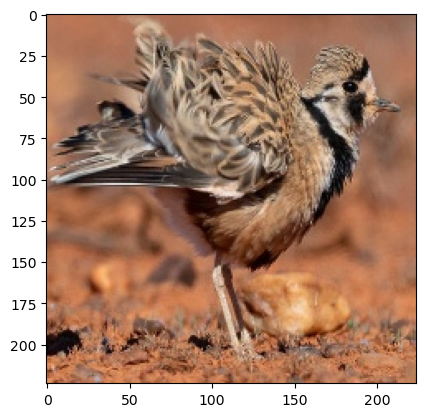

In [15]:
example_path = 'dataset/Image_Classification/dataset_25428842/INLAND DOTTEREL/08.jpg'
os.path.isfile(example_path)
img = cv2.imread(example_path)
print(img.shape)
plt.imshow(img[..., ::-1])

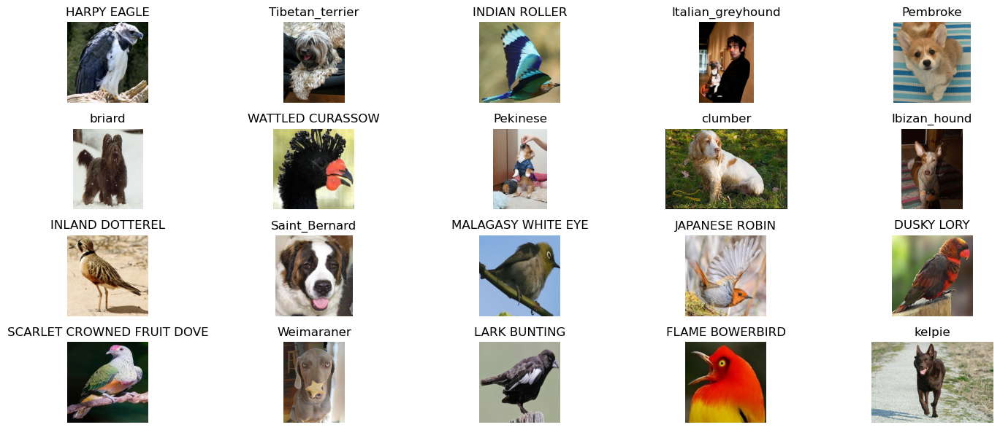

In [16]:

import os
import cv2
import matplotlib.pyplot as plt
import random

# Path to the dataset containing class subfolders
dataset_path = 'dataset/Image_Classification/dataset_25428842/'

# Get a list of class directories
class_dirs = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]

# Randomly select 10 different classes
selected_classes = random.sample(class_dirs, 20)

# Create a plot
fig, axes = plt.subplots(4, 5, figsize=(15, 6))

for i, class_name in enumerate(selected_classes):
    class_path = os.path.join(dataset_path, class_name)
    
    # List image files in the class folder
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    if image_files:
        # Pick one image (you can randomize this as well)
        img_file = random.choice(image_files)
        img_path = os.path.join(class_path, img_file)
        img = cv2.imread(img_path)
        
        if img is not None:
            row = i // 5
            col = i % 5
            axes[row, col].imshow(img[..., ::-1])  # Convert BGR to RGB
            axes[row, col].axis('off')
            axes[row, col].set_title(class_name)
        else:
            print(f"Could not read image: {img_path}")
    else:
        print(f"No images found in class: {class_name}")

plt.tight_layout()
plt.show()


In [17]:
#resize the image into same size

img_size=(299,299)

images_train = [] #initializing Lists for Storing Data
labels_train = []  #initializing Lists for Storing corresponsing labels
class_names=os.listdir(data_dir)  #List all folders inside train dicrectory, and stores folders names into class_names

print(class_names) # print all the class names which represent labels

for folder in os.listdir(data_dir): #Loop goes through each folder(class) inside data_dir
  folder_path=os.path.join(data_dir,folder) # folder_path stores the full path to the class folder.
  # print(folder_path)
  if not os.path.isdir(folder_path): # if path is not a folder, print out Not Processing and skps it
    print(f"Not Processing : {folder_path}")
    continue

  for file in os.listdir(folder_path):
    img_path = os.path.join(folder_path, file)
    if os.path.isfile(img_path):
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.resize(img, img_size)  # resize to fixed size
            images_train.append(img)
            labels_train.append(folder)


                
images_train = np.array(images_train)
labels_train = np.array(labels_train)

print(np.shape(images_train))
print(np.shape(labels_train))

['DUSKY LORY', 'FLAME BOWERBIRD', 'HARPY EAGLE', 'INDIAN ROLLER', 'INLAND DOTTEREL', 'Ibizan_hound', 'Italian_greyhound', 'JAPANESE ROBIN', 'LARK BUNTING', 'MALAGASY WHITE EYE', 'Pekinese', 'Pembroke', 'SCARLET CROWNED FRUIT DOVE', 'Saint_Bernard', 'Tibetan_terrier', 'WATTLED CURASSOW', 'Weimaraner', 'briard', 'clumber', 'kelpie']
(2584, 299, 299, 3)
(2584,)


In [18]:
print(class_names)

['DUSKY LORY', 'FLAME BOWERBIRD', 'HARPY EAGLE', 'INDIAN ROLLER', 'INLAND DOTTEREL', 'Ibizan_hound', 'Italian_greyhound', 'JAPANESE ROBIN', 'LARK BUNTING', 'MALAGASY WHITE EYE', 'Pekinese', 'Pembroke', 'SCARLET CROWNED FRUIT DOVE', 'Saint_Bernard', 'Tibetan_terrier', 'WATTLED CURASSOW', 'Weimaraner', 'briard', 'clumber', 'kelpie']


In [19]:
val_dir = "dataset/Image_Classification/Split_Image_Classification/val"


images_val = []
labels_val = []
class_names=os.listdir(val_dir)

print(class_names)

for folder in os.listdir(val_dir):
  folder_path=os.path.join(val_dir,folder)

  if not os.path.isdir(folder_path):
    print(f"Not Processing : {folder_path}")
    continue

  for file in os.listdir(folder_path):
    img_path = os.path.join(folder_path, file)
    if os.path.isfile(img_path):
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.resize(img, img_size)  # resize to fixed size
            images_val.append(img)
            labels_val.append(folder)

images_val = np.array(images_val)
labels_val = np.array(labels_val)

print(np.shape(images_val))
print(np.shape(labels_val))

['DUSKY LORY', 'FLAME BOWERBIRD', 'HARPY EAGLE', 'INDIAN ROLLER', 'INLAND DOTTEREL', 'Ibizan_hound', 'Italian_greyhound', 'JAPANESE ROBIN', 'LARK BUNTING', 'MALAGASY WHITE EYE', 'Pekinese', 'Pembroke', 'SCARLET CROWNED FRUIT DOVE', 'Saint_Bernard', 'Tibetan_terrier', 'WATTLED CURASSOW', 'Weimaraner', 'briard', 'clumber', 'kelpie']
(316, 299, 299, 3)
(316,)


In [20]:
test_dir = "dataset/Image_Classification/Split_Image_Classification/test"


images_test = []
labels_test = []
class_names=os.listdir(test_dir)

print(class_names)

for folder in os.listdir(test_dir):
  folder_path=os.path.join(test_dir,folder)

  if not os.path.isdir(folder_path):
    print(f"Not Processing : {folder_path}")
    continue

  for file in os.listdir(folder_path):
    img_path = os.path.join(folder_path, file)
    if os.path.isfile(img_path):
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.resize(img, img_size)  # resize to fixed size
            images_test.append(img)
            labels_test.append(folder)
            
images_test = np.array(images_test)
labels_test = np.array(labels_test)

print(np.shape(images_test))
print(np.shape(labels_test))

['DUSKY LORY', 'FLAME BOWERBIRD', 'HARPY EAGLE', 'INDIAN ROLLER', 'INLAND DOTTEREL', 'Ibizan_hound', 'Italian_greyhound', 'JAPANESE ROBIN', 'LARK BUNTING', 'MALAGASY WHITE EYE', 'Pekinese', 'Pembroke', 'SCARLET CROWNED FRUIT DOVE', 'Saint_Bernard', 'Tibetan_terrier', 'WATTLED CURASSOW', 'Weimaraner', 'briard', 'clumber', 'kelpie']
(341, 299, 299, 3)
(341,)


In [21]:
images_train.shape

(2584, 299, 299, 3)

In [22]:
# images_train= images_train/ 255.0

In [23]:
images_train[0].shape

(299, 299, 3)

In [29]:
# images_val= images_val/ 255.0

In [30]:
# images_test= images_test/ 255.0

In [24]:
print(np.shape(images_train))
print(np.shape(images_val))
print(np.shape(images_test))

(2584, 299, 299, 3)
(316, 299, 299, 3)
(341, 299, 299, 3)


In [25]:
train_dir=data_dir

In [26]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [27]:
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      brightness_range=[0.8, 1.2],
      channel_shift_range=0.2,
      fill_mode='nearest')

In [28]:
test_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

In [29]:
# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        train_dir,  # This is the source directory for training images
        target_size=(299, 299),  # All images will be resized to 64*64
        batch_size=20,
        class_mode='categorical')  # Because it is multiclass, use as categorical

Found 2584 images belonging to 20 classes.


In [30]:
from collections import Counter

# Reverse the class_indices dictionary to map indices → class names
idx_to_class = {v: k for k, v in train_generator.class_indices.items()}


def print_distribution(gen):
    counter = Counter(gen.classes)
    # Print class name and count
    for cls_idx, num in counter.items():
        print(f'Class {idx_to_class[cls_idx]}: {num}')

In [31]:
print_distribution(train_generator)

Class DUSKY LORY: 115
Class FLAME BOWERBIRD: 125
Class HARPY EAGLE: 131
Class INDIAN ROLLER: 137
Class INLAND DOTTEREL: 125
Class Ibizan_hound: 150
Class Italian_greyhound: 145
Class JAPANESE ROBIN: 124
Class LARK BUNTING: 124
Class MALAGASY WHITE EYE: 118
Class Pekinese: 119
Class Pembroke: 144
Class SCARLET CROWNED FRUIT DOVE: 122
Class Saint_Bernard: 136
Class Tibetan_terrier: 164
Class WATTLED CURASSOW: 114
Class Weimaraner: 128
Class briard: 121
Class clumber: 120
Class kelpie: 122


In [32]:
# Flow validation images in batches of 20 using test_datagen generator
validation_generator = val_datagen.flow_from_directory(
        val_dir,
        target_size=(299, 299),
        batch_size=20,
        class_mode='categorical') 
# Validation_generator should add shuffle=Fales, but in this case, it will not impact the result due to the result was evaludated during training process.
# Model tracked it consistently per epoch

Found 316 images belonging to 20 classes.


In [33]:
print_distribution(validation_generator)

Class DUSKY LORY: 14
Class FLAME BOWERBIRD: 15
Class HARPY EAGLE: 16
Class INDIAN ROLLER: 17
Class INLAND DOTTEREL: 15
Class Ibizan_hound: 18
Class Italian_greyhound: 18
Class JAPANESE ROBIN: 15
Class LARK BUNTING: 15
Class MALAGASY WHITE EYE: 14
Class Pekinese: 14
Class Pembroke: 18
Class SCARLET CROWNED FRUIT DOVE: 15
Class Saint_Bernard: 17
Class Tibetan_terrier: 20
Class WATTLED CURASSOW: 14
Class Weimaraner: 16
Class briard: 15
Class clumber: 15
Class kelpie: 15


In [34]:
# Flow validation images in batches of 20 using test_datagen generator
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(299, 299),
        batch_size=20,
        class_mode='categorical',
        shuffle=False
)

Found 341 images belonging to 20 classes.


In [35]:
test_generator.classes

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  7,  7,  7,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
        9,  9,  9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
       11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 13, 13

<h2>Step3: Implement GoogleNet, together with Checkpoint and Early Stop</h2>

In [36]:
# Import required package for Inception-GoogleNet

In [37]:
import keras
from keras.layers import Layer
import keras.backend as K
import tensorflow as tf

from keras.models import Model
from keras.layers import Conv2D, MaxPool2D,  \
    Dropout, Dense, Input, concatenate,      \
    GlobalAveragePooling2D, AveragePooling2D,\
    Flatten

import cv2
import numpy as np
from keras.datasets import cifar10
from keras import backend as K
from keras import utils
#from keras.utils import np_utils

import math
from keras.optimizers import SGD
from keras.callbacks import LearningRateScheduler

In [38]:
base_model = keras.applications.InceptionV3(weights='imagenet', include_top=False)

# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
#  add a fully-connected layer
x = Dense(1024, activation='relu')(x)
# and a logistic layer -- we have 20 classes
predictions = Dense(20, activation='softmax')(x)

# this is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)

I0000 00:00:1746832029.668335    1523 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1746832030.295440    1523 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1746832030.300641    1523 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1746832030.305336    1523 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [39]:
from keras.callbacks import ModelCheckpoint

In [40]:
# Define checkpoint filepath format
filepath = './weights/weights.{epoch:02d}-{val_loss:.2f}.keras'

# Create the ModelCheckpoint callback
checkpoint = ModelCheckpoint(
    filepath=filepath,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,   # Save full model
    mode='auto',
    save_freq='epoch'
)

In [41]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping

In [42]:
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=20,
    restore_best_weights=True,
    verbose=1
)

In [43]:
#Define the number of epochs and learning rate
epochs = 200
initial_lrate = 0.001

#Create Learning rate decay
def decay(epoch, steps=100):
    initial_lrate = 0.001
    drop = 0.96
    epochs_drop = 8
    lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    return lrate

#Define SGD paramenters
sgd = SGD(learning_rate=initial_lrate, momentum=0.9, nesterov=False)

lr_sc = LearningRateScheduler(decay, verbose=1)

## Compile Model
model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

In [44]:
%pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [48]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


<h2>Step4: Start Training</h2> 

<h3> A. Train with 1 epoch to test the result </h3>

In [49]:
history = model.fit(
      train_generator,
      steps_per_epoch=100,  # 2000 images = batch_size * steps
      epochs=1,
      validation_data=validation_generator,
      validation_steps=10,  # 1000 images = batch_size * steps
      callbacks = [checkpoint, lr_sc, early_stop],
      verbose=1)

/opt/conda/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 1: LearningRateScheduler setting learning rate to 0.001.


I0000 00:00:1745983192.533480    6295 service.cc:146] XLA service 0x7f8a4c081d60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745983192.533511    6295 service.cc:154]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2025-04-30 03:19:53.245057: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-04-30 03:19:55.381864: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90701
I0000 00:00:1745983230.908850    6295 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 755ms/step - accuracy: 0.4172 - loss: 2.3767 
Epoch 1: val_loss improved from inf to 0.29586, saving model to ./weights/weights.01-0.30.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 143s 842ms/step - accuracy: 0.4196 - loss: 2.3697 - val_accuracy: 0.9400 - val_loss: 0.2959 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 1.


<h3> B. Train Epochs until Trigger the early stop </h3> 

In [50]:
history2 = model.fit(
      train_generator,
      steps_per_epoch=100,  # 2000 images = batch_size * steps
      epochs=200,
      validation_data=validation_generator,
      validation_steps=10,  # 1000 images = batch_size * steps
      callbacks = [checkpoint, lr_sc, early_stop],
      verbose=1)


Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step - accuracy: 0.9267 - loss: 0.4150 
Epoch 1: val_loss improved from 0.29586 to 0.08749, saving model to ./weights/weights.01-0.09.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 446ms/step - accuracy: 0.9267 - loss: 0.4144 - val_accuracy: 0.9850 - val_loss: 0.0875 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/200
 30/100 ━━━━━━━━━━━━━━━━━━━━ 28s 403ms/step - accuracy: 0.9424 - loss: 0.2342

/opt/conda/lib/python3.11/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 2: val_loss improved from 0.08749 to 0.07891, saving model to ./weights/weights.02-0.08.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 14s 138ms/step - accuracy: 0.9489 - loss: 0.2140 - val_accuracy: 0.9850 - val_loss: 0.0789 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step - accuracy: 0.9674 - loss: 0.1562 
Epoch 3: val_loss did not improve from 0.07891
100/100 ━━━━━━━━━━━━━━━━━━━━ 44s 433ms/step - accuracy: 0.9674 - loss: 0.1561 - val_accuracy: 0.9700 - val_loss: 0.0994 - learning_rate: 0.0010

Epoch 4: LearningRateScheduler setting learning rate to 0.001.
Epoch 4/200
 30/100 ━━━━━━━━━━━━━━━━━━━━ 27s 397ms/step - accuracy: 0.9768 - loss: 0.1344
Epoch 4: val_loss improved from 0.07891 to 0.06360, saving model to ./weights/weights.04-0.06.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - accuracy: 0.9703 - loss: 0.1388 - val_accuracy: 0.9850 - val_loss: 0.0636 - learning_rate: 0.0010

Epoch 5: Le

In [51]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


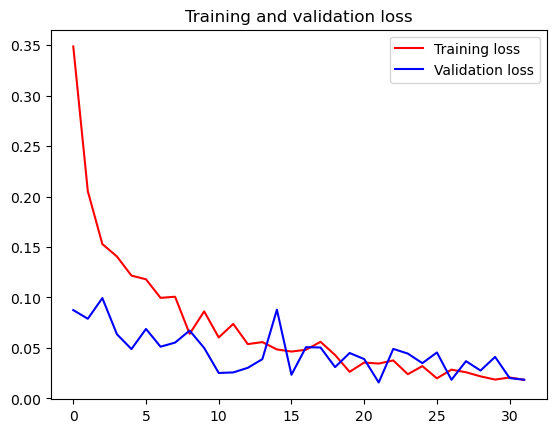

In [53]:
## Plot the Traning and Validation loss
loss = history2.history['loss']
val_loss = history2.history['val_loss']

epochs = range(len(loss))

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

In [61]:
model.evaluate(train_generator, verbose=1)
model.evaluate(validation_generator, verbose=1)

/opt/conda/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1746099539.515920    1423 service.cc:146] XLA service 0x7fbeac0562e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746099539.515952    1423 service.cc:154]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2025-05-01 11:38:59.716361: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-05-01 11:39:00.565537: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90701


  1/130 ━━━━━━━━━━━━━━━━━━━━ 26:25 12s/step - accuracy: 0.0500 - loss: 3.1632

I0000 00:00:1746099547.625129    1423 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


130/130 ━━━━━━━━━━━━━━━━━━━━ 71s 452ms/step - accuracy: 0.0561 - loss: 3.1413
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 495ms/step - accuracy: 0.0380 - loss: 3.1549    


[3.138017416000366, 0.04113924130797386]

<h2> Step5: Load the best Model</h2>

In [42]:
!ls ./weights/

weights.01-0.08.keras	weights.11-2.70.keras	weights.34-2.38.keras
weights.01-0.09.keras	weights.11-2.71.keras	weights.35-1.07.keras
weights.01-0.26.keras	weights.11-2.99.keras	weights.35-1.15.keras
weights.01-0.30.keras	weights.11-3.13.keras	weights.35-1.92.keras
weights.01-0.38.keras	weights.111-1.50.keras	weights.35-1.97.keras
weights.01-0.40.keras	weights.113-1.64.keras	weights.35-2.30.keras
weights.01-1.00.keras	weights.114-1.47.keras	weights.35-2.32.keras
weights.01-1.33.keras	weights.114-1.62.keras	weights.35-2.36.keras
weights.01-1.72.keras	weights.115-1.40.keras	weights.36-0.17.keras
weights.01-10.39.keras	weights.115-1.62.keras	weights.36-1.31.keras
weights.01-2.34.keras	weights.116-1.61.keras	weights.36-1.90.keras
weights.01-2.78.keras	weights.117-1.58.keras	weights.37-1.30.keras
weights.01-2.85.keras	weights.118-1.54.keras	weights.37-1.91.keras
weights.01-2.87.keras	weights.118-1.55.keras	weights.37-2.27.keras
weights.01-2.91.keras	weights.118-1.61.keras	weights.37-2.35.kera

In [45]:
import tensorflow as tf

In [46]:
model_best=tf.keras.models.load_model('./weights/weights.22-0.02.keras')

In [47]:
train_loss, train_accuracy = model_best.evaluate(train_generator, verbose=1)

/opt/conda/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1746832091.436157    1621 service.cc:146] XLA service 0x7f9548056830 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746832091.436204    1621 service.cc:154]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2025-05-09 23:08:11.679267: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-05-09 23:08:12.527736: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90701


  1/130 ━━━━━━━━━━━━━━━━━━━━ 26:21 12s/step - accuracy: 1.0000 - loss: 0.0010

I0000 00:00:1746832099.667217    1621 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


130/130 ━━━━━━━━━━━━━━━━━━━━ 70s 445ms/step - accuracy: 0.9986 - loss: 0.0060


In [48]:
val_loss, val_accuracy = model_best.evaluate(validation_generator, verbose=1)

16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 494ms/step - accuracy: 0.9937 - loss: 0.0515


In [49]:
test_loss, test_accuracy = model_best.evaluate(test_generator, verbose=1)

18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 374ms/step - accuracy: 0.9761 - loss: 0.0841


In [54]:
import pandas as pd

# Create a DataFrame to report results with updated column order
performance_df = pd.DataFrame({
    'Dataset': ['Train', 'Validation', 'Test'],
    'Accuracy': [train_accuracy, val_accuracy, test_accuracy],
    'Loss': [train_loss, val_loss, test_loss]
})

# Format accuracy as percentages with 2 decimal points
performance_df['Accuracy'] = performance_df['Accuracy'].apply(lambda x: f"{x*100:.2f}%")
performance_df['Loss'] = performance_df['Loss'].apply(lambda x: f"{x:.4f}")

# Display the performance table
print("Baseline GoogLeNetV3 Performance:")
display(performance_df)

Baseline GoogLeNetV3 Performance:


,Dataset,Accuracy,Loss
0,Train,99.85%,0.0076
1,Validation,99.37%,0.0414
2,Test,96.77%,0.0980


<h2> Step 6: Check the evaluation result for the best model</h2>

18/18 ━━━━━━━━━━━━━━━━━━━━ 13s 411ms/step
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  8  8  8  8
  8  8  8  8  8  8  8  8  8  8  8  8  8  9  9  9  9  9  9  9  9  9  9  9
  9  9  9  9  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11
 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 16 16 16 16 16 16 16 16 16 16
 16 16 16 16 16 16 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 18 18
 18 18 18

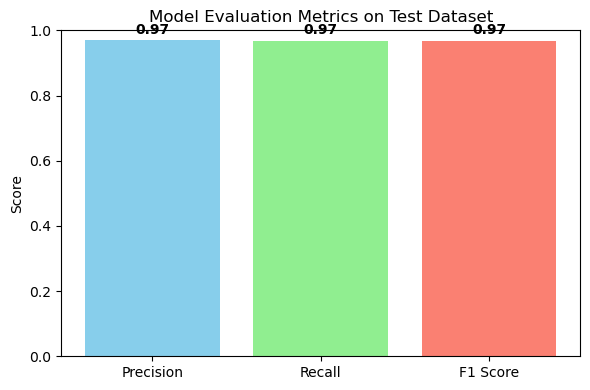

In [55]:
import numpy as np
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt

# Step 1: Get predictions
y_pred_probs = model_best.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Step 2: Get true labels
y_true = test_generator.classes   # works if using ImageDataGenerator

print(y_true)
# Step 3: Compute metrics
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

# Optional: print full classification report
print(classification_report(y_true, y_pred))

# Step 4: Plot metrics
metrics = [precision, recall, f1]
metric_names = ['Precision', 'Recall', 'F1 Score']

plt.figure(figsize=(6, 4))
plt.bar(metric_names, metrics, color=['skyblue', 'lightgreen', 'salmon'])
plt.ylim(0, 1)
plt.title('Model Evaluation Metrics on Test Dataset')
plt.ylabel('Score')
for i, v in enumerate(metrics):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontweight='bold')
plt.tight_layout()
plt.show()


In [47]:
print(y_pred_probs[0])
print(y_true)

[9.94915724e-01 1.21610612e-03 9.55993746e-05 1.16887546e-04
 1.07787775e-04 1.57459421e-04 3.16805745e-05 3.95925803e-04
 6.43934109e-05 2.54260580e-04 1.52217952e-04 8.33361191e-05
 1.22729791e-04 7.89374753e-05 8.17066320e-05 1.15191157e-03
 1.00286234e-04 5.22166782e-04 1.37134644e-04 2.13492895e-04]
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  8  8  8  8
  8  8  8  8  8  8  8  8  8  8  8  8  8  9  9  9  9  9  9  9  9  9  9  9
  9  9  9  9  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11
 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 13 13 13 13 

In [48]:

print(y_true)

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  8  8  8  8
  8  8  8  8  8  8  8  8  8  8  8  8  8  9  9  9  9  9  9  9  9  9  9  9
  9  9  9  9  9 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 11 11 11
 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 16 16 16 16 16 16 16 16 16 16
 16 16 16 16 16 16 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 18 18
 18 18 18 18 18 18 18 18 18 18 18 18 18 19 19 19 19

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step 


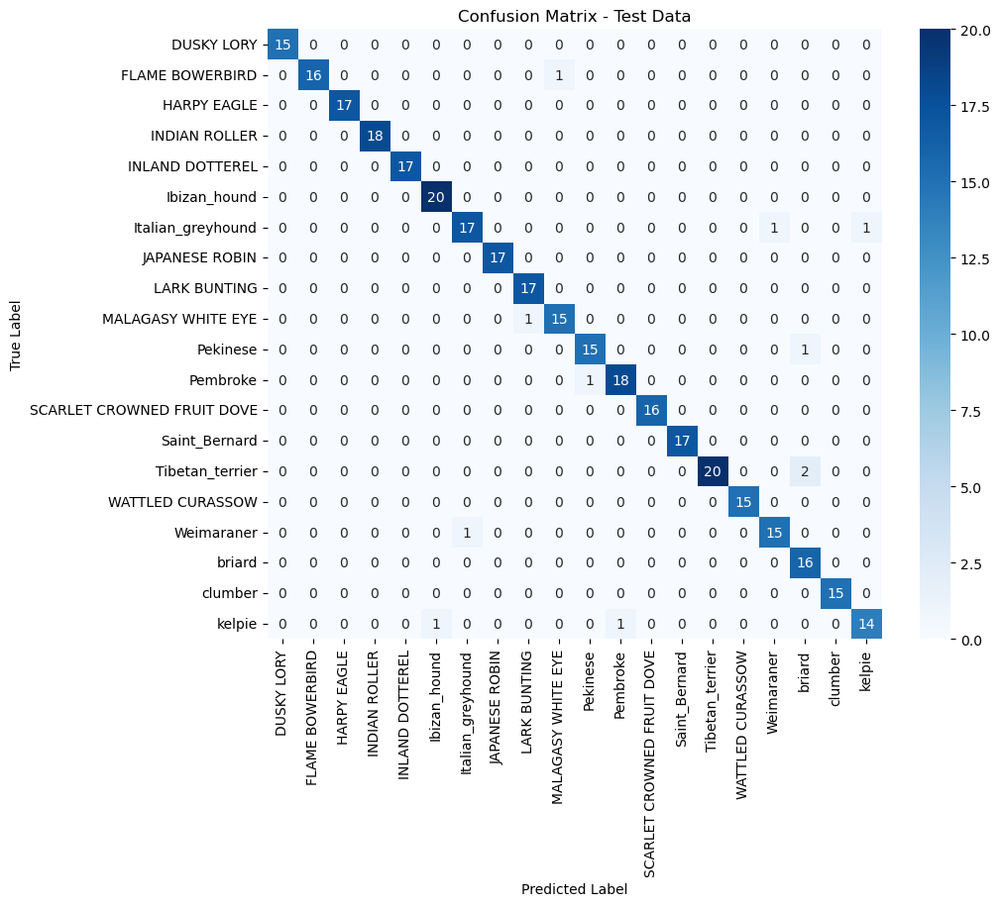

Classification Report:

                            precision    recall  f1-score   support

                DUSKY LORY       1.00      1.00      1.00        15
           FLAME BOWERBIRD       1.00      0.94      0.97        17
               HARPY EAGLE       1.00      1.00      1.00        17
             INDIAN ROLLER       1.00      1.00      1.00        18
           INLAND DOTTEREL       1.00      1.00      1.00        17
              Ibizan_hound       0.95      1.00      0.98        20
         Italian_greyhound       0.94      0.89      0.92        19
            JAPANESE ROBIN       1.00      1.00      1.00        17
              LARK BUNTING       0.94      1.00      0.97        17
        MALAGASY WHITE EYE       0.94      0.94      0.94        16
                  Pekinese       0.94      0.94      0.94        16
                  Pembroke       0.95      0.95      0.95        19
SCARLET CROWNED FRUIT DOVE       1.00      1.00      1.00        16
             Saint_Bern

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Get model predictions for validation data
test_predictions = model_best.predict(test_generator, verbose=1)

# Convert predicted probabilities to class labels
predicted_classes = np.argmax(test_predictions, axis=1)

# Get true class labels
true_classes = test_generator.classes

# Get class label names
class_labels = list(test_generator.class_indices.keys())

# Create confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix - Test Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Optional: Print classification report
print("Classification Report:\n")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

<h2> Step 7: Visualise the result in test generator</h2>

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step 


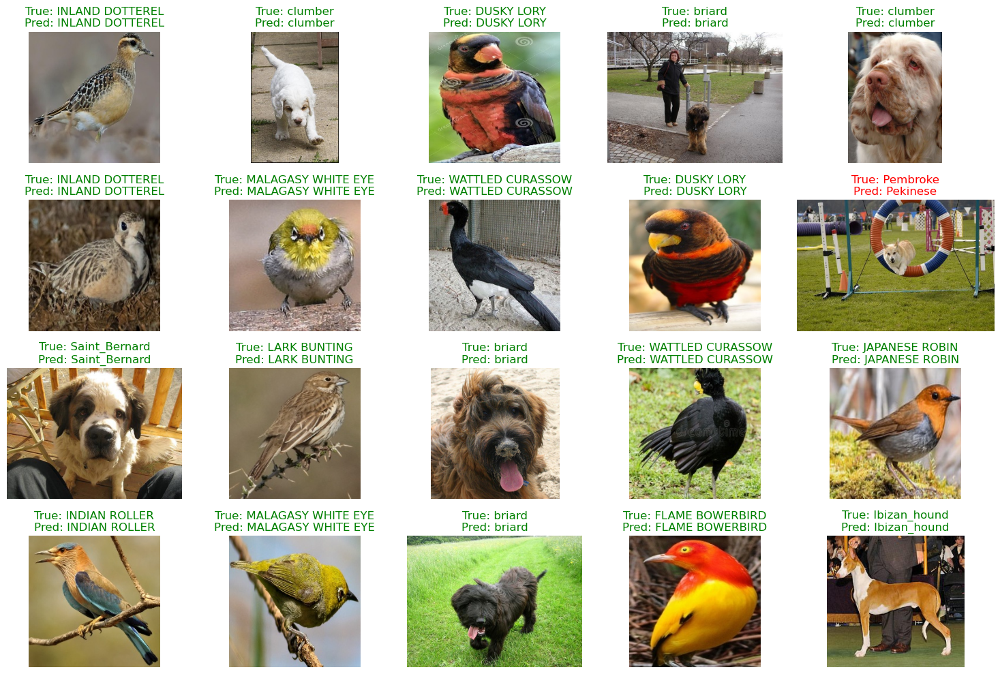

In [50]:
import matplotlib.pyplot as plt
import numpy as np
import random
from tensorflow.keras.preprocessing.image import array_to_img

# Get class labels
class_indices = test_generator.class_indices
class_names = list(class_indices.keys())

# Step 1: Predict
y_pred_probs = model_best.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Step 2: Get true labels and filenames
y_true = test_generator.classes
filenames = test_generator.filenames

# Step 3: Display random sample predictions
n_images = 20  # number of images to display
indices = random.sample(range(len(filenames)), n_images)

plt.figure(figsize=(15, 10))
for i, idx in enumerate(indices):
    img_path = test_generator.filepaths[idx]
    img = plt.imread(img_path)

    plt.subplot(4, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    
    true_label = class_names[y_true[idx]]
    pred_label = class_names[y_pred[idx]]
    
    color = 'green' if true_label == pred_label else 'red'
    plt.title(f"True: {true_label}\nPred: {pred_label}", color=color)

plt.tight_layout()
plt.show()

<h2> Step8: Show the model Summary and information</h2>

In [14]:
model_best.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, None,      │        864 │ input_layer[0][0] │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, None,      │      9,216 │ activation[0][0]  │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, None,      │     18,432 │ activation_1[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, None,      │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, None,      │      5,120 │ max_pooling2d[0]… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │    138,240 │ activation_3[0][… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ batch_normalizat

 Total params: 47,808,490 (182.37 MB)

 Trainable params: 23,887,028 (91.12 MB)

 Non-trainable params: 34,432 (134.50 KB)

 Optimizer params: 23,887,030 (91.12 MB)

In [1]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [7]:
model_img_file = 'GoogleNet-model.png'
tf.keras.utils.plot_model(model_best, to_file=model_img_file,
                          show_shapes=False,
                          show_layer_activations=False,
                          show_dtype=False,
                          show_layer_names=False )

In [54]:
!pip install pydot

In [56]:
!apt-get install graphviz -y

E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?


In [58]:
!pip install pydot graphviz

In [60]:
!dot -V

dot - graphviz version 12.2.1 (20250203.1708)


In [61]:
from tensorflow.keras.utils import plot_model

plot_model(model_best,
           to_file='GNet-model.png',
           show_shapes=True,
           show_layer_names=True,
           show_layer_activations=True,
           show_dtype=True)

You must install pydot (`pip install pydot`) for `plot_model` to work.


In [ ]:
# Using Plot_Model from Keras.Utils
model_img_file = 'GNet-model.png'
tf.keras.utils.plot_model(model_best, to_file=model_img_file,
                          show_shapes=True,
                          show_layer_activations=True,
                          show_dtype=True,
                          show_layer_names=True)

# Also Try:
# show_shapes=True, show_layer_activations=True, show_dtype=True, show_layer_names=True

In [53]:
from IPython.display import FileLink

FileLink('GNet-model.png')

/home/sagemaker-user/GNet-model.png

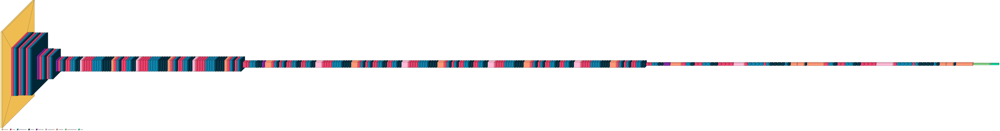

In [30]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras import Input
import visualkeras

# Build the model
input_tensor = Input(shape=(299, 299, 3))
model = InceptionV3(weights=None, include_top=True, input_tensor=input_tensor)

# Visualize the full architecture
visualkeras.layered_view(model, legend=True, draw_volume=True)


In [54]:
print(f"Total number of layers: {len(model_best.layers)}")

Total number of layers: 314


In [55]:
inception_blocks = [layer.name for layer in model.layers if "mixed" in layer.name]
print("Inception Blocks:", inception_blocks)
print("Total Inception Blocks:", len(inception_blocks))

Inception Blocks: ['mixed0', 'mixed1', 'mixed2', 'mixed3', 'mixed4', 'mixed5', 'mixed6', 'mixed7', 'mixed8', 'mixed9_0', 'mixed9', 'mixed9_1', 'mixed10']
Total Inception Blocks: 13
